### TC5035.10 Proyecto Integrador
 
Dra. Grettel Barceló Alonso
Dr. Luis Eduardo Falcón Morales
 
**Avance 1. Análisis exploratorio de datos**

**“Modelos para la Optimización de Precios en Estaciones de Autoservicio”**

Liga Github: https://github.com/A01793499-DiegoGuerra/Proyecto-Integrador-Equipo18/tree/main

Diego Fernando Guerra Burgos	A01793499
Esteban Sánchez Retamoza		A01740631
Hansel Zapiain Rodríguez		A00469031
 
Abril 2024

**Objetivos**
2.1 Elegir las características más relevantes para reducir la dimensionalidad y aumentar la capacidad de generalización del modelo.

2.2 Abordar y corregir los problemas identificados en los das

**Instrucciones**

Este primer avance consiste en realizar un análisis exploratorio de datos (EDA - Exploratory Data Analysis), es decir, describir los datos utilizando técnicas estadísticas y de visualización (análisis univariante y bi/multivariante) para hacer enfoque en sus aspectos más relevantes, así como aplicar y justificar operaciones de preprocesamiento, relacionadas con el manejo de valores faltantes, atípicos y alta cardinalidad. Es importante que incluyan sus conclusiones del EDA, identificando tendencias o relaciones importantes.

Las siguientes son algunas de las preguntas comunes que podrán abordar a través del EDA:

¿Hay valores faltantes en el conjunto de datos? ¿Se pueden identificar patrones de ausencia? 
¿Cuáles son las estadísticas resumidas del conjunto de datos?
¿Hay valores atípicos en el conjunto de datos?
¿Cuál es la cardinalidad de las variables categóricas?
¿Existen distribuciones sesgadas en el conjunto de datos? ¿Necesitamos aplicar alguna transformación no lineal?
¿Se identifican tendencias temporales? (En caso de que el conjunto incluya una dimensión de tiempo).
¿Hay correlación entre las variables dependientes e independientes?
¿Cómo se distribuyen los datos en función de diferentes categorías?
¿Existen patrones o agrupaciones (clusters) en los datos con características similares?
¿Se deberían normalizar las imágenes para visualizarlas mejor?
¿Hay desequilibrio en las clases de la variable objetivo?
Deberán contar con un repositorio en GitHubLinks to an external site., para compartir los resultados con el equipo docente. to


***Importar Librerias***

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import statsmodels.api as sm
import plotly.express as px

from datetime_truncate import truncate
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.signal import periodogram

In [2]:
%matplotlib inline

***Consolidación de datos (Opcional)***

In [3]:
path = '99_Datasets/'# this needs to be changed to the directory of the excel files

cost_files_db = [f'{path}Compras 2022 V2.xlsx', f'{path}Compras 2023 V2.xlsx', f'{path}Compras 2024 V2.xlsx']
df_cost = pd.DataFrame()

for file in cost_files_db:
    year_db_cost = pd.read_excel(file, skiprows = 4)
    df_cost = pd.concat([df_cost, year_db_cost], ignore_index = True)

df_cost.to_pickle(f'{path}base_compras_combinada_v2.pkl')


sales_files_db = [f'{path}Ventas 2022 V2.xlsx', f'{path}Ventas 2023 V2.xlsx', f'{path}Ventas 2024 V2.xlsx']
df_sales = pd.DataFrame()

for file in sales_files_db:
    year_db_sales = pd.read_excel(file, skiprows = 4)
    df_sales = pd.concat([df_sales, year_db_sales], ignore_index = True)

df_sales.to_pickle(f'{path}base_ventas_combinada_v2.pkl')

***Carga de Bases***

Para este proyecto tenemos 2 fuentes de información primarias que se obtuvieron directamente de los sistemas ERP del Grupo Golden

**Transacciones de Ventas**: Considera todos los despachos ejecutados en una gasolinera de grupo golden, incluyendo la distinción de volumenes de compra así como datos adicionales.

**Transacciones de Compra**: Considera todas las operaciones de compra de combustible para reabastecer a la gasolinera.

In [4]:
df_sales = pd.read_pickle('99_Datasets/base_ventas_combinada_v2.pkl')
df_sales.head()

,Folio,Fecha,Hora,Posición,Cod.Externo,Producto,Precio de Venta del litro con impuestos,Precio de Venta del litro sin impuestos,I.E.P.S.,IVA,Venta Unidades,IVA total,IEPS Total,Venta sin impuestos,Venta Ticket (con impuestos)
0,3042508-0,2022-01-01,00:11:00,4,1.0,MAGNA,19.29,15.824424,0.4514,3.014176,9.798,29.532896,4.422817,155.047706,189.00342
1,3042509-0,2022-01-01,00:18:00,3,2.0,PREMIUM,22.49,18.512424,0.4514,3.526176,33.748,119.001388,15.233847,624.757285,758.99252
2,3042510-0,2022-01-01,00:20:00,3,1.0,MAGNA,19.29,15.824424,0.4514,3.014176,9.798,29.532896,4.422817,155.047706,189.00342
3,3042511-0,2022-01-01,00:25:00,4,1.0,MAGNA,19.29,15.824424,0.4514,3.014176,14.723,44.377713,6.645962,232.982995,284.00667
4,3042512-0,2022-01-01,00:30:00,4,1.0,MAGNA,19.29,15.824424,0.4514,3.014176,9.798,29.532896,4.422817,155.047706,189.00342


In [5]:
df_purchases = pd.read_pickle('99_Datasets/base_compras_combinada_v2.pkl')
df_purchases.head()

,Folio,Fecha,Hora,Tanque,Volumen,Precio Factura,IVA F,IEPS F,Sin imp F,Por litro U,Producto,IVA U,IEPS U,Sin imp U
0,3737260,2022-01-03,12:22:00,2 [1:MAGNA],29644.12,582799.98,91113.62016,13339.8540,478346.50584,19.659885,MAGNA,3.073582,0.45,16.136303
1,3740687,2022-01-06,10:05:00,1 [3:DIESEL],19417.05,381800.01,59938.51224,7184.3085,314677.18926,19.663132,DIESEL,3.086901,0.37,16.206231
2,3741826,2022-01-07,09:22:00,2 [1:MAGNA],28198.25,570584.01,89263.16760,12689.2125,468631.62990,20.234731,MAGNA,3.165557,0.45,16.619174
3,3741848,2022-01-07,09:58:00,2 [1:MAGNA],30200.52,570585.01,89119.16416,13590.2340,467875.61184,18.893218,MAGNA,2.950915,0.45,15.492303
4,3745298,2022-01-10,08:01:00,2 [1:MAGNA],25639.59,504900.02,78937.95272,11537.8155,414424.25178,19.692203,MAGNA,3.078753,0.45,16.163451


***Información Básica Fuentes de Información***

Disponemos de una base de ventas de 15 variables. También tenemos dos variables (Fecha y Hora) las cuales deben ser cambiadas a formato DATETIME para poder analizar componentes temporales. En cuanto a la variable Posición, que es una variable categórica y tiene formato de una variable numérica, debe ser cambiada para reflejar el verdadero tipo de dato.

In [6]:
df_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 888783 entries, 0 to 888782
Data columns (total 15 columns):
 #   Column                                   Non-Null Count   Dtype         
---  ------                                   --------------   -----         
 0   Folio                                    888783 non-null  object        
 1   Fecha                                    888783 non-null  datetime64[ns]
 2   Hora                                     888783 non-null  object        
 3   Posición                                 888783 non-null  int64         
 4   Cod.Externo                              785767 non-null  float64       
 5   Producto                                 888720 non-null  object        
 6   Precio de Venta del litro con impuestos  888783 non-null  float64       
 7   Precio de Venta del litro sin impuestos  888783 non-null  float64       
 8   I.E.P.S.                                 888720 non-null  float64       
 9   IVA                       

In [7]:
df_sales.rename(columns = {'Folio':'Folio_Venta', 'Precio de Venta del litro con impuestos':'Precio Bruto', 'Precio de Venta del litro sin impuestos':'Precio Neto', 'Venta Ticket (con impuestos)':'Venta Bruta', 'Venta sin impuestos':'Venta Neta', 'Venta Unidades':'Volumen despachado'}, inplace = True)

Disponemos de una base de compras de 14 variables. También tenemos dos variables (Fecha y Hora) las cuales deben ser cambiadas a formato DATETIME para poder unir ambas bases. De la misma manera tenemos datos a nivel factura asi como nivel unitarios. Para determinar el margen bruto de cada operación de despacho, nuestro interes es el costo unitario del combustible por lo que los campos IVA F, IEPS F, Sin Imp F y Precio Factura los descartaremos del data frame más adelante. En cuanto a la variable Tanque, que es una variable categórica, debe ser eliminada del análisis dado que solo es un indicador de donde fue depositado el combustible por lo que no agregara valor al análisis más adelante

In [8]:
df_purchases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 685 entries, 0 to 684
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Folio           685 non-null    int64         
 1   Fecha           685 non-null    datetime64[ns]
 2   Hora            685 non-null    object        
 3   Tanque          685 non-null    object        
 4   Volumen         685 non-null    float64       
 5   Precio Factura  684 non-null    float64       
 6   IVA F           685 non-null    float64       
 7   IEPS F          685 non-null    float64       
 8   Sin imp F       685 non-null    float64       
 9   Por litro U     685 non-null    float64       
 10  Producto        685 non-null    object        
 11  IVA U           685 non-null    float64       
 12   IEPS U         685 non-null    float64       
 13  Sin imp U       685 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(1), object(3)
memo

In [9]:
df_purchases.drop(['Precio Factura', 'IVA F', 'IEPS F', 'Sin imp F', 'Tanque'], axis = 1, inplace = True)
df_purchases.rename(columns = {'Folio':'Folio_Compra','Por litro U':'Costo Bruto', 'Sin imp U':'Costo Neto'}, inplace = True)

***Transformación de Bases***

Para consolidar las bases de datos es importante garantizar que todos los campos de fecha existentes sean los correctos. En los siguientes pasos se crearan las estampas de tiempo que nos permitiran hacer este proceso, de la misma manera nos garantizará que podamos hacer análisis de temporalidad hacia adelante. De la misma manera se eliminaran los campos de Fecha y Hora dado que todas las operaciones hacia adelante se buscaran hacer con la estampa de tiempo

In [10]:
df_sales['sale_date'] = pd.to_datetime(df_sales['Fecha'], errors = 'coerce', infer_datetime_format = True)
df_sales['sale_localtime'] = pd.to_timedelta(df_sales['Hora'].astype(str))
df_sales['sale_timeStamp'] = df_sales['sale_date'] + df_sales['sale_localtime']

df_sales.drop(['Fecha', 'Hora'], axis = 1, inplace = True)
df_sales.head()

C:\Users\hzapi\AppData\Local\Temp\ipykernel_51476\2138479121.py:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df_sales['sale_date'] = pd.to_datetime(df_sales['Fecha'], errors = 'coerce', infer_datetime_format = True)


,Folio_Venta,Posición,Cod.Externo,Producto,Precio Bruto,Precio Neto,I.E.P.S.,IVA,Volumen despachado,IVA total,IEPS Total,Venta Neta,Venta Bruta,sale_date,sale_localtime,sale_timeStamp
0,3042508-0,4,1.0,MAGNA,19.29,15.824424,0.4514,3.014176,9.798,29.532896,4.422817,155.047706,189.00342,2022-01-01,0 days 00:11:00,2022-01-01 00:11:00
1,3042509-0,3,2.0,PREMIUM,22.49,18.512424,0.4514,3.526176,33.748,119.001388,15.233847,624.757285,758.99252,2022-01-01,0 days 00:18:00,2022-01-01 00:18:00
2,3042510-0,3,1.0,MAGNA,19.29,15.824424,0.4514,3.014176,9.798,29.532896,4.422817,155.047706,189.00342,2022-01-01,0 days 00:20:00,2022-01-01 00:20:00
3,3042511-0,4,1.0,MAGNA,19.29,15.824424,0.4514,3.014176,14.723,44.377713,6.645962,232.982995,284.00667,2022-01-01,0 days 00:25:00,2022-01-01 00:25:00
4,3042512-0,4,1.0,MAGNA,19.29,15.824424,0.4514,3.014176,9.798,29.532896,4.422817,155.047706,189.00342,2022-01-01,0 days 00:30:00,2022-01-01 00:30:00


In [11]:
df_purchases['purchase_date'] = pd.to_datetime(df_purchases['Fecha'], errors = 'coerce', infer_datetime_format = True)
df_purchases['purchase_localtime'] = pd.to_timedelta(df_purchases['Hora'].astype(str))
df_purchases['purchase_timeStamp'] = df_purchases['purchase_date'] + df_purchases['purchase_localtime']

df_purchases.drop(['Fecha', 'Hora'], axis = 1, inplace = True)
df_purchases.head()

C:\Users\hzapi\AppData\Local\Temp\ipykernel_51476\3299460077.py:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df_purchases['purchase_date'] = pd.to_datetime(df_purchases['Fecha'], errors = 'coerce', infer_datetime_format = True)


,Folio_Compra,Volumen,Costo Bruto,Producto,IVA U,IEPS U,Costo Neto,purchase_date,purchase_localtime,purchase_timeStamp
0,3737260,29644.12,19.659885,MAGNA,3.073582,0.45,16.136303,2022-01-03,0 days 12:22:00,2022-01-03 12:22:00
1,3740687,19417.05,19.663132,DIESEL,3.086901,0.37,16.206231,2022-01-06,0 days 10:05:00,2022-01-06 10:05:00
2,3741826,28198.25,20.234731,MAGNA,3.165557,0.45,16.619174,2022-01-07,0 days 09:22:00,2022-01-07 09:22:00
3,3741848,30200.52,18.893218,MAGNA,2.950915,0.45,15.492303,2022-01-07,0 days 09:58:00,2022-01-07 09:58:00
4,3745298,25639.59,19.692203,MAGNA,3.078753,0.45,16.163451,2022-01-10,0 days 08:01:00,2022-01-10 08:01:00


***Información datos faltantes o NA***

En este caso, los datos de venta principales como la fecha de transacción, cantidad de combustible, tipo de combustible, precio, entre otros, no registran valores faltantes. La gran mayoría de datos faltantes se observan en información del cliente como tipo de vehículo, el nombre, placas, etc. En este caso, los patrones de ausencia se deben a la falta de recolección o estandarización de este tipo de datos por parte de la gasolinera.

In [12]:
#Calculando data faltante en la base de datos por columna
missing_percentage_per_column_sales = (df_sales.isnull().mean() * 100).round(2)
print("Presencia de datos faltantes por dimensión (en porcentaje):")
print(missing_percentage_per_column_sales)

Presencia de datos faltantes por dimensión (en porcentaje):
Folio_Venta            0.00
Posición               0.00
Cod.Externo           11.59
Producto               0.01
Precio Bruto           0.00
Precio Neto            0.00
I.E.P.S.               0.01
IVA                    0.00
Volumen despachado     0.00
IVA total              0.00
IEPS Total             0.00
Venta Neta             0.00
Venta Bruta            0.00
sale_date              0.00
sale_localtime         0.00
sale_timeStamp         0.00
dtype: float64


En este caso, los datos de compras principales como la fecha de transacción, cantidad de combustible, tipo de combustible, precio, entre otros, no registran valores faltantes. 

In [13]:
#Calculando data faltante en la base de datos por columna
missing_percentage_per_column_purchases = (df_purchases.isnull().mean() * 100).round(2)
print("Presencia de datos faltantes por dimensión (en porcentaje):")
print(missing_percentage_per_column_purchases)

Presencia de datos faltantes por dimensión (en porcentaje):
Folio_Compra          0.0
Volumen               0.0
Costo Bruto           0.0
Producto              0.0
IVA U                 0.0
 IEPS U               0.0
Costo Neto            0.0
purchase_date         0.0
purchase_localtime    0.0
purchase_timeStamp    0.0
dtype: float64


***Unificación de Bases***

Usando las estampas de tiempo obtendremos el costo de reposición de cada despacho a cliente. Esto nos permitirá obtener un cálculo de margen bruto que al finalizar estará atado con nuestro objetivo final de optimización de precios

In [14]:
df_sales.sort_values(['Producto', 'sale_date'], inplace = True)
df_purchases.sort_values(['Producto', 'purchase_date'], inplace = True)

df_master = pd.DataFrame()

for product_type in df_sales['Producto'].unique():

    sales_temp = df_sales[df_sales['Producto'] == product_type]
    purchases_temp = df_purchases[df_purchases['Producto'] == product_type]
    
    merged_temp = pd.merge_asof(sales_temp, purchases_temp, left_on = 'sale_date', right_on = 'purchase_date',
                                by = 'Producto', direction = 'backward')

    # Append the result to the main DataFrame
    df_master = pd.concat([df_master, merged_temp], ignore_index = True)

df_master.head(5000)

,Folio_Venta,Posición,Cod.Externo,Producto,Precio Bruto,Precio Neto,I.E.P.S.,IVA,Volumen despachado,IVA total,...,sale_timeStamp,Folio_Compra,Volumen,Costo Bruto,IVA U,IEPS U,Costo Neto,purchase_date,purchase_localtime,purchase_timeStamp
0,3042725-0,10,3.0,DIESEL,20.99,17.252424,0.4514,3.286176,78.657,258.480746,...,2022-01-01 14:39:00,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaT
1,3042818-0,10,3.0,DIESEL,20.99,17.252424,0.4514,3.286176,13.721,45.089621,...,2022-01-01 17:42:00,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaT
2,3042846-0,9,3.0,DIESEL,20.99,17.252424,0.4514,3.286176,82.325,270.534439,...,2022-01-01 18:40:00,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaT
3,3043188-0,10,3.0,DIESEL,20.99,17.316852,0.3747,3.298448,15.912,52.484905,...,2022-01-02 13:03:00,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaT
4,3043285-0,10,3.0,DIESEL,20.99,17.316852,0.3747,3.298448,68.560,226.141595,...,2022-01-02 14:49:00,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,3171223-0,10,3.0,DIESEL,24.99,20.653668,0.4023,3.934032,381.610,1501.265952,...,2022-04-23 20:55:00,3864889.0,9697.17,24.336997,3.83472,0.37,20.132278,2022-04-22,0 days 11:44:00,2022-04-22 11:44:00
4996,3171252-0,9,3.0,DIESEL,24.99,20.653668,0.4023,3.934032,0.050,0.196702,...,2022-04-23 21:12:00,3864889.0,9697.17,24.336997,3.83472,0.37,20.132278,2022-04-22,0 days 11:44:00,2022-04-22 11:44:00
4997,3171255-0,9,3.0,DIESEL,24.99,20.653668,0.4023,3.934032,0.040,0.157361,...,2022-04-23 21:12:00,3864889.0,9697.17,24.336997,3.83472,0.37,20.132278,2022-04-22,0 days 11:44:00,2022-04-22 11:44:00
4998,3171365-0,10,3.0,DIESEL,24.99,20.653668,0.4023,3.934032,50.680,199.376742,...,2022-04-24 00:25:00,3864889.0,9697.17,24.336997,3.83472,0.37,20.132278,2022-04-22,0 days 11:44:00,2022-04-22 11:44:00


***Información Básica Data Frame***

In [15]:
df_master.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 888720 entries, 0 to 888719
Data columns (total 25 columns):
 #   Column              Non-Null Count   Dtype          
---  ------              --------------   -----          
 0   Folio_Venta         888720 non-null  object         
 1   Posición            888720 non-null  int64          
 2   Cod.Externo         785767 non-null  float64        
 3   Producto            888720 non-null  object         
 4   Precio Bruto        888720 non-null  float64        
 5   Precio Neto         888720 non-null  float64        
 6   I.E.P.S.            888720 non-null  float64        
 7   IVA                 888720 non-null  float64        
 8   Volumen despachado  888720 non-null  float64        
 9   IVA total           888720 non-null  float64        
 10  IEPS Total          888720 non-null  float64        
 11  Venta Neta          888720 non-null  float64        
 12  Venta Bruta         888720 non-null  float64        
 13  sale_date     

In [16]:
df_sales.describe()

,Posición,Cod.Externo,Precio Bruto,Precio Neto,I.E.P.S.,IVA,Volumen despachado,IVA total,IEPS Total,Venta Neta,Venta Bruta,sale_date,sale_localtime,sale_timeStamp
count,888783.000000,785767.00000,888783.000000,888783.000000,888720.000000,888783.000000,8.887830e+05,8.887830e+05,8.887830e+05,8.887830e+05,8.887830e+05,888783,888783,888783
mean,4.469676,1.18409,21.337248,17.510346,0.491633,3.335304,5.714201e+01,1.914115e+02,2.752536e+01,1.004911e+03,1.223852e+03,2023-02-04 17:29:32.203564032,0 days 14:01:43.514941217,2023-02-05 07:31:15.718504960
min,1.000000,1.00000,0.000000,0.000000,0.374700,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2022-01-01 00:00:00,0 days 00:00:00,2022-01-01 00:11:00
25%,3.000000,1.00000,20.490000,16.832424,0.484700,3.206176,7.140000e+00,2.342525e+01,3.509228e+00,1.229826e+02,1.499250e+02,2022-07-08 00:00:00,0 days 09:57:00,2022-07-08 19:40:00
50%,4.000000,1.00000,21.190000,17.392452,0.484700,3.312848,1.000000e+01,3.312848e+01,4.897894e+00,1.739245e+02,2.119000e+02,2023-01-21 00:00:00,0 days 14:15:00,2023-01-21 00:03:00
75%,6.000000,1.00000,21.990000,18.032700,0.522500,3.434800,2.196300e+01,7.458539e+01,1.110496e+01,3.915733e+02,4.777805e+02,2023-08-28 00:00:00,0 days 18:01:00,2023-08-28 19:41:30
max,13.000000,3.00000,25.990000,21.493668,0.637500,4.094032,3.341517e+07,1.106994e+08,1.619633e+07,5.811717e+08,7.080675e+08,2024-04-30 00:00:00,0 days 23:59:00,2024-04-30 23:54:00
std,2.337038,0.50755,1.259953,1.046974,0.040695,0.199424,3.547829e+04,1.175616e+05,1.719119e+04,6.171985e+05,7.519500e+05,NaN,0 days 04:53:55.206477320,NaN


***Estadísticas de las variables***

In [17]:
unique_values_per_column = df_master.nunique()
unique_values_per_column

Folio_Venta           888720
Posición                  13
Cod.Externo                3
Producto                   3
Precio Bruto              30
Precio Neto               58
I.E.P.S.                   9
IVA                       58
Volumen despachado     25632
IVA total              82317
IEPS Total             57832
Venta Neta             82316
Venta Bruta            77722
sale_date                851
sale_localtime          1440
sale_timeStamp        565170
Folio_Compra             596
Volumen                  499
Costo Bruto              595
IVA U                    595
 IEPS U                    3
Costo Neto               595
purchase_date            450
purchase_localtime       409
purchase_timeStamp       596
dtype: int64

In [18]:
print('Identificación de manguera dispensadora:')
print(df_master['Posición'].value_counts())

Identificación de manguera dispensadora:
Posición
4     173808
2     130734
6     124458
3     115470
5      87812
1      83450
8      69633
7      56350
10     25251
9      21736
11        10
12         7
13         1
Name: count, dtype: int64


In [19]:
print('Tipo de Combustible vendido:')
print(df_master['Producto'].value_counts())

Tipo de Combustible vendido:
Producto
MAGNA      766167
PREMIUM     75549
DIESEL      47004
Name: count, dtype: int64


***Presencia de valores atípicos***

Nuestras variables numéricas son Volumen, Precio Neto, Precio Bruto, Costo Neto, Costo Bruto, Venta Bruta. En estos gráficos de Caja y Densidad podemos observar la presencia de valores atípicos en Cantidad e Importe. Estos datos atípicos reflejan valores demasiado altos, lo cual resulta en que exista una distribución sesgada a la izquierda. Se debería eliminar estos registros para observar la nueva distribución.

En el caso de Precio, podemos observar que existe una distribución ligeramente sesgada a la izquierda, con la presencia de pocos valores atípicos, pero que se encuentran en valores lógicos, a comparación de los valores atípicos en las otras variables.

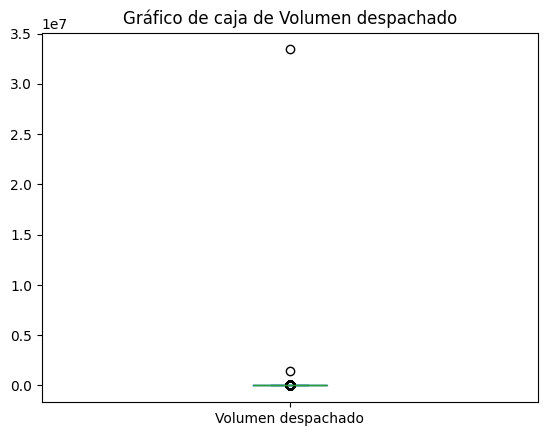

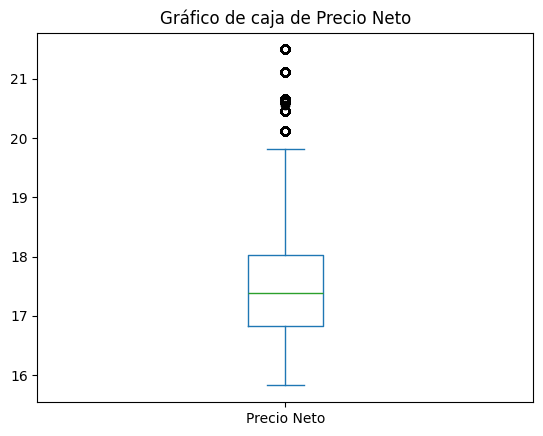

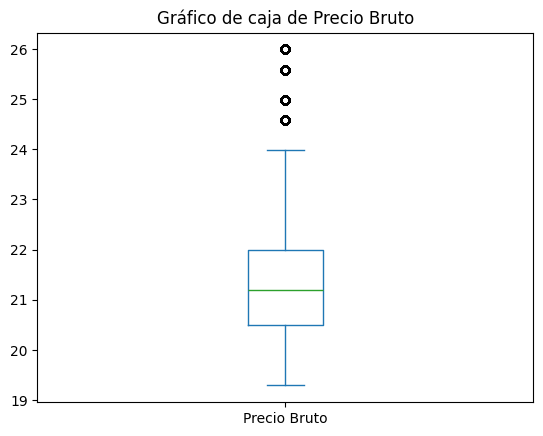

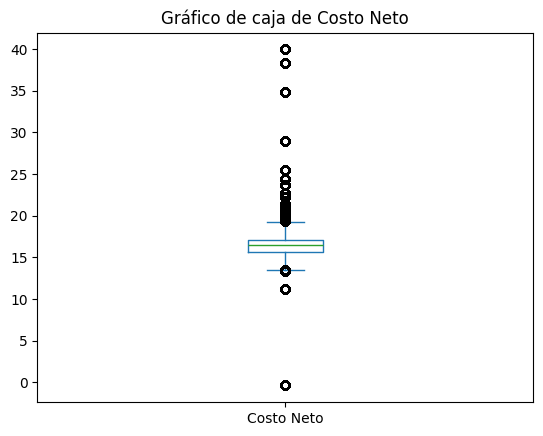

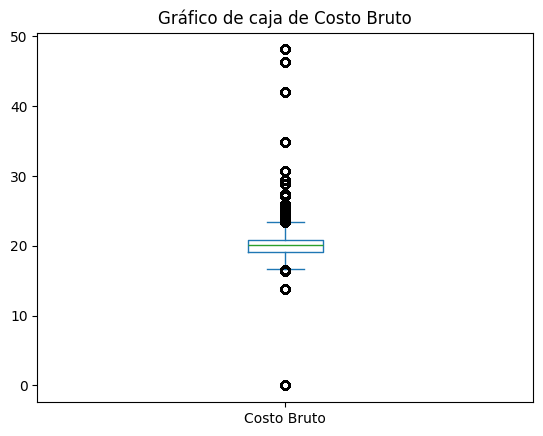

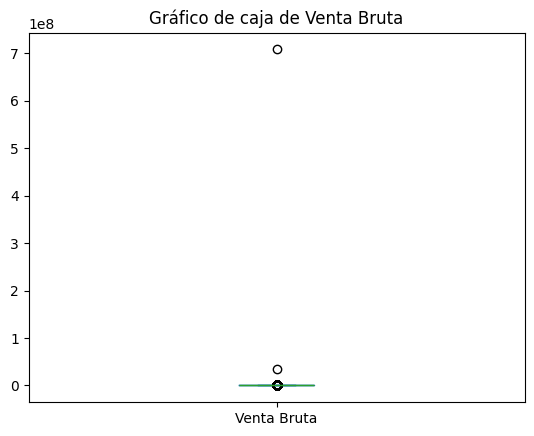

In [20]:
columnas_numericas = ['Volumen despachado', 'Precio Neto', 'Precio Bruto', 'Costo Neto', 'Costo Bruto','Venta Bruta']

for column in columnas_numericas:
    plt.figure()
    df_master[column].plot(kind = 'box')
    plt.title(f'Gráfico de caja de {column}')
    plt.show()

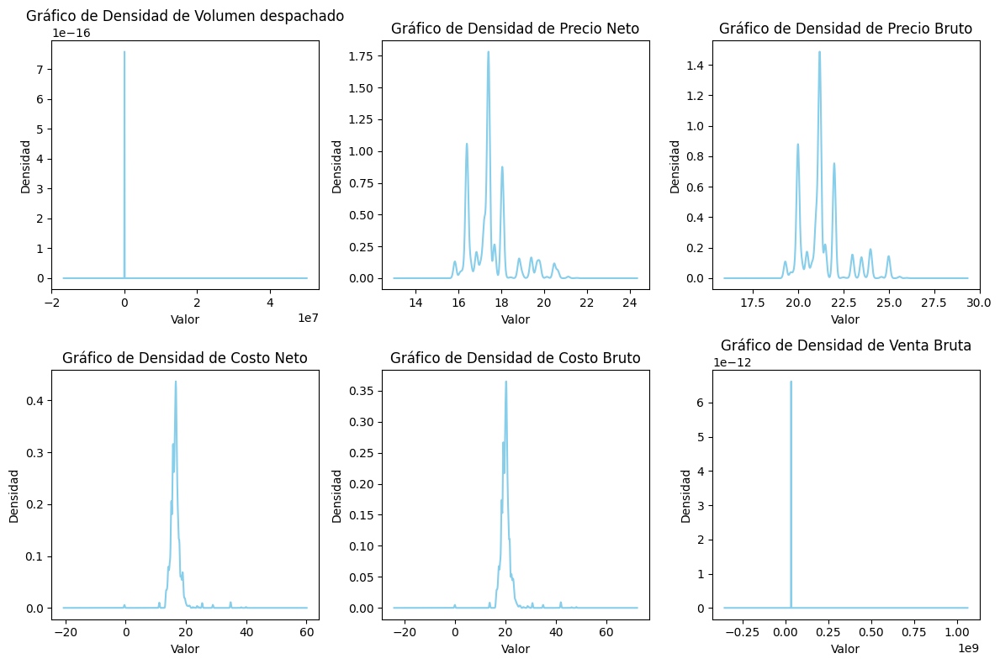

In [21]:
plt.figure(figsize = (12, 8))

for i, columna in enumerate(columnas_numericas, 1):
    plt.subplot(2, 3, i)
    df_master[columna].plot(kind = 'density', color = 'skyblue')
    plt.xlabel('Valor')
    plt.ylabel('Densidad')
    plt.title(f'Gráfico de Densidad de {columna}')

plt.tight_layout()
plt.show()

***Tratamiento de valores atípicos***

En este caso podemos observar que existen valores atípicos que tal vez son producto de mal registro por parte de la Gasolinera, lo que resulta en valores demasiado altos. Por ejemplo, el valor máximo de *Cantidad* se ubica en 6 millones de galones por una sola venta (un vehículo promedio se llena con 12 galones). Por lo cual para filtrar estos datos atípicos, vamos a eliminar, solamente para este análisis exploratorio, el 10% de los datos más altos de la serie de *Cantidad*.

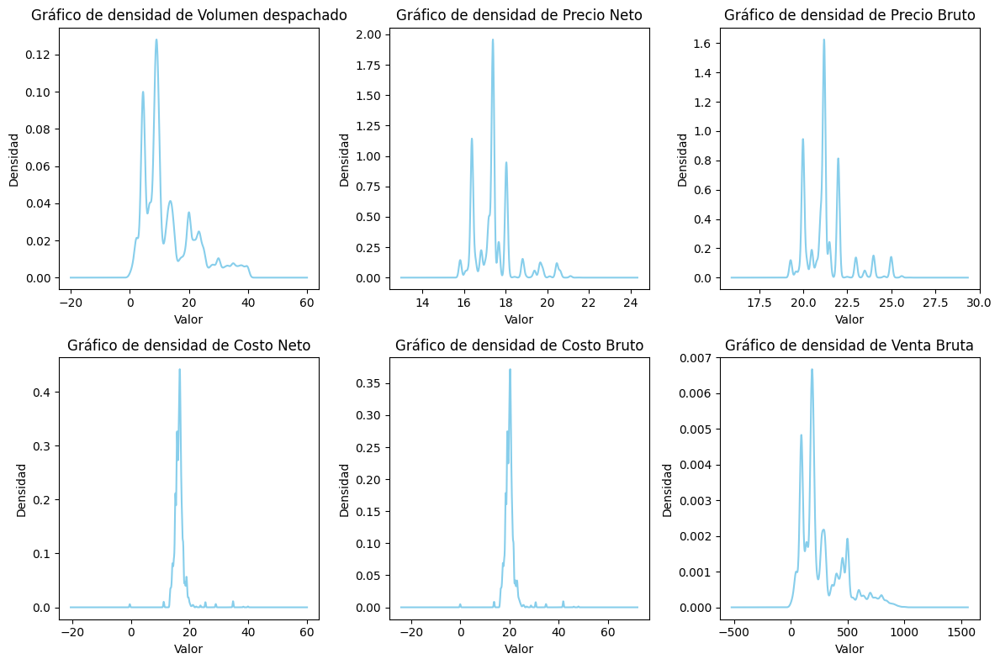

In [22]:
df_master_filter = df_master[df_master['Volumen despachado'] <= df_master['Volumen despachado'].quantile(0.90)].copy()

plt.figure(figsize = (12, 8))

for i, columna in enumerate(columnas_numericas, 1):
    plt.subplot(2, 3, i)
    df_master_filter[columna].plot(kind = 'density', color = 'skyblue')
    plt.xlabel('Valor')
    plt.ylabel('Densidad')
    plt.title(f'Gráfico de densidad de {columna}')

plt.tight_layout()
plt.show()

Una vez que filtramos los datos atípicos, observamos que las variables *Cantidad* e *Importe*, tienen una distribución similar, con un ligero sesgo a la izquierda. De la misma manera aprovecharemos para eliminar todos aquellos valores que no tengan datos faltantes. De la misma manera normalizamos a nivel hora dado que esto nos permitirá hacer un mejor análisis hacia adelante

In [23]:
df_master_filter.reset_index(drop = True, inplace = True)
df_master_filter.drop('Cod.Externo', axis = 1, inplace = True)
df_master_filter.dropna(axis = 0 , inplace = True)

In [24]:
df_master_filter['sale_timeStamp'] = df_master_filter['sale_timeStamp'].dt.floor('H')

C:\Users\hzapi\AppData\Local\Temp\ipykernel_51476\3427309698.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_master_filter['sale_timeStamp'] = df_master_filter['sale_timeStamp'].dt.floor('H')


In [25]:
df_master_filter.info()

<class 'pandas.core.frame.DataFrame'>
Index: 801899 entries, 50 to 803387
Data columns (total 24 columns):
 #   Column              Non-Null Count   Dtype          
---  ------              --------------   -----          
 0   Folio_Venta         801899 non-null  object         
 1   Posición            801899 non-null  int64          
 2   Producto            801899 non-null  object         
 3   Precio Bruto        801899 non-null  float64        
 4   Precio Neto         801899 non-null  float64        
 5   I.E.P.S.            801899 non-null  float64        
 6   IVA                 801899 non-null  float64        
 7   Volumen despachado  801899 non-null  float64        
 8   IVA total           801899 non-null  float64        
 9   IEPS Total          801899 non-null  float64        
 10  Venta Neta          801899 non-null  float64        
 11  Venta Bruta         801899 non-null  float64        
 12  sale_date           801899 non-null  datetime64[ns] 
 13  sale_localtime    

In [26]:
df_master_filter.to_pickle(f'base_master.pkl')

***Análisis básico***

In [27]:
df_master_filter = pd.read_pickle('base_master.pkl')

In [28]:
def date_info(df_interest, timeStamp): 
    df_interest['Hour'] = df_interest[timeStamp].dt.hour
    df_interest['Month'] = df_interest[timeStamp].dt.month
    df_interest['Year'] = df_interest[timeStamp].dt.year
    df_interest['Day of Week'] = df_interest[timeStamp].dt.dayofweek
    
    dmap = {0:'Mon', 1:'Tue', 2:'Wed', 3:'Thu', 4:'Fri', 5:'Sat', 6:'Sun'}
    dmap = {0:'Mon', 1:'Tue', 2:'Wed', 3:'Thu', 4:'Fri', 5:'Sat', 6:'Sun'}
    
    df_interest['Day of Week'] = df_interest['Day of Week'].map(dmap)
    df_interest['Clean Date'] = df_interest[timeStamp].dt.floor('D')

In [29]:
df_alt = df_master_filter.copy()
date_info(df_alt,'sale_timeStamp')

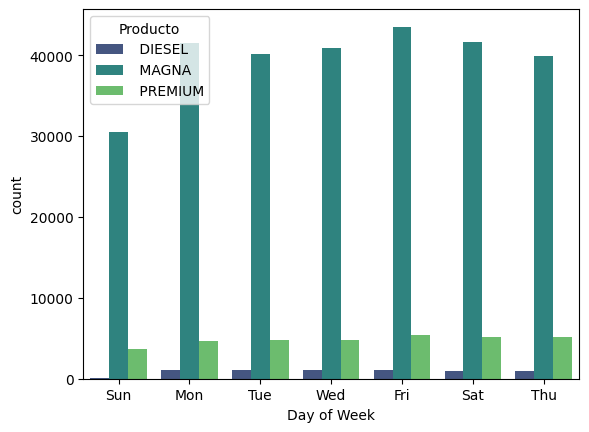

In [30]:
sns.countplot(x = 'Day of Week', hue = 'Producto', data = df_alt[df_alt['Year'] == 2023], palette = 'viridis')
plt.show()

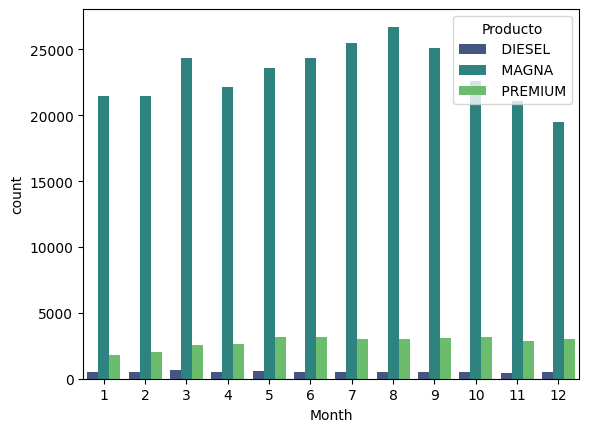

In [31]:
sns.countplot(x = 'Month', hue = 'Producto', data = df_alt[df_alt['Year'] == 2023], palette = 'viridis')
plt.show()

***Transformación de datos para procesamiento por fecha***

Dado que estaremos trabajando con análisis de regresión para estimar demandas es necesario construir todas las estampas de manera que nos permita identificar patrones de demanda específicos (i.e. temporalidades). Es por esto que tenemos que generar un proceso de sumarización, además de asegurar que tenemos datos para la frecuencia mínima decidida (i.e. día hora) dentro los dataframes. De la misma manera se calcula el margen bruto para futuros análisis.

In [32]:
df_master_summary = df_master_filter.groupby(by = ['Producto','sale_timeStamp']).agg({
    'Precio Bruto' : [('Precio Bruto', 'mean')],
    'Precio Neto' : [('Precio Neto', 'mean')],
    'Volumen despachado' : [('Volumen despachado', 'sum'),('transaction_num', 'count')],
    'Venta Neta' : [('Venta Neta', 'sum')],
    'Venta Bruta' : [('Venta Bruta', 'sum')],
    'Costo Bruto' : [('Costo Bruto', 'mean')],
    'Costo Neto' : [('Costo Neto', 'mean')],
    'purchase_timeStamp' : [('purchase_timeStamp', 'min')]
}).reset_index()
df_master_summary.columns = [col[1] if col[1] else col[0] for col in df_master_summary.columns.values]

In [33]:
df_master_summary['Margen Bruto'] = df_master_summary['Venta Bruta'] - df_master_summary['Costo Bruto'] * df_master_summary['Volumen despachado']

In [34]:
df_master_summary.head()

,Producto,sale_timeStamp,Precio Bruto,Precio Neto,Volumen despachado,transaction_num,Venta Neta,Venta Bruta,Costo Bruto,Costo Neto,purchase_timeStamp,Margen Bruto
0,DIESEL,2022-01-06 06:00:00,20.99,17.316852,130.952,5,2267.676403,2748.68248,19.663132,16.206231,2022-01-06 10:05:00,173.756067
1,DIESEL,2022-01-06 07:00:00,20.99,17.316852,31.014,2,537.064848,650.98386,19.663132,16.206231,2022-01-06 10:05:00,41.151496
2,DIESEL,2022-01-06 08:00:00,20.99,17.316852,36.370,1,629.813907,763.40630,19.663132,16.206231,2022-01-06 10:05:00,48.258203
3,DIESEL,2022-01-06 09:00:00,20.99,17.316852,7.527,1,130.343945,157.99173,19.663132,16.206231,2022-01-06 10:05:00,9.987338
4,DIESEL,2022-01-06 10:00:00,20.99,17.316852,59.830,2,1036.067255,1255.83170,19.663132,16.206231,2022-01-06 10:05:00,79.386535


In [35]:
start_date = df_master_summary['sale_timeStamp'].min()
end_date = df_master_summary['sale_timeStamp'].max()

all_dates = pd.date_range(start = start_date, end = end_date, freq = 'h')

In [36]:
def process_product_type(product_type):
    product_df = df_master_summary[df_master_summary['Producto'] == product_type]
    product_df = product_df.set_index('sale_timeStamp').reindex(all_dates).rename_axis('sale_timeStamp').reset_index()
   
    product_df['Precio Bruto'] = product_df['Precio Bruto'].ffill()
    product_df['Precio Neto'] = product_df['Precio Neto'].ffill()
    
    product_df['Costo Bruto'] = product_df['Costo Bruto'].ffill()
    product_df['Costo Neto'] = product_df['Costo Neto'].ffill()

    product_df['purchase_timeStamp'] = product_df['purchase_timeStamp'].ffill()
    
    product_df['Venta Neta'] = product_df['Venta Neta'].fillna(0)
    product_df['Venta Bruta'] = product_df['Venta Bruta'].fillna(0)

    product_df['Volumen despachado'] = product_df['Volumen despachado'].fillna(0)
    product_df['transaction_num'] = product_df['transaction_num'].fillna(0)
    product_df['Margen Bruto'] = product_df['Costo Neto'].fillna(0)

    product_df['Precio Bruto'] = product_df['Precio Bruto'].fillna(0)
    product_df['Precio Neto'] = product_df['Precio Neto'].fillna(0)
    
    product_df['Costo Bruto'] = product_df['Costo Bruto'].fillna(0)
    product_df['Costo Neto'] = product_df['Costo Neto'].fillna(0)

    product_df['purchase_timeStamp'] = product_df['purchase_timeStamp'].fillna(start_date)
    
    product_df['Producto'] = product_type
    
    return product_df

In [37]:
product_types = df_master_summary['Producto'].unique()
product_dfs = {ptype: process_product_type(ptype) for ptype in product_types}

In [38]:
df_magna = product_dfs[' MAGNA']
df_premium = product_dfs[' PREMIUM']
df_diesel = product_dfs[' DIESEL']

In [39]:
df_product_time = pd.concat([df_magna, df_premium,df_diesel], ignore_index = True)
date_info(df_product_time,'sale_timeStamp')

In [40]:
df_product_time.head()

,sale_timeStamp,Producto,Precio Bruto,Precio Neto,Volumen despachado,transaction_num,Venta Neta,Venta Bruta,Costo Bruto,Costo Neto,purchase_timeStamp,Margen Bruto,Hour,Month,Year,Day of Week,Clean Date
0,2022-01-03 00:00:00,MAGNA,19.29,15.824424,34.214,5.0,541.416843,659.98806,19.659885,16.136303,2022-01-03 12:22:00,16.136303,0,1,2022,Mon,2022-01-03
1,2022-01-03 01:00:00,MAGNA,19.29,15.824424,47.537,5.0,752.245644,916.98873,19.659885,16.136303,2022-01-03 12:22:00,16.136303,1,1,2022,Mon,2022-01-03
2,2022-01-03 02:00:00,MAGNA,19.29,15.824424,61.741,6.0,977.015762,1190.98389,19.659885,16.136303,2022-01-03 12:22:00,16.136303,2,1,2022,Mon,2022-01-03
3,2022-01-03 03:00:00,MAGNA,19.29,15.824424,4.769,1.0,75.466678,91.99401,19.659885,16.136303,2022-01-03 12:22:00,16.136303,3,1,2022,Mon,2022-01-03
4,2022-01-03 04:00:00,MAGNA,19.29,15.824424,14.256,2.0,225.592989,274.99824,19.659885,16.136303,2022-01-03 12:22:00,16.136303,4,1,2022,Mon,2022-01-03


***Análisis de Temporalidad General***

In [41]:
df_timeseries = df_product_time[['Clean Date', 'Hour', 'Month', 'Year', 'Day of Week', 'Volumen despachado', 'Producto','transaction_num']]

In [42]:
grouped_date = df_timeseries.groupby(by = ['Clean Date', 'Producto']).sum().reset_index()
grouped_dayHour = df_timeseries.drop('Clean Date', axis = 1).groupby(by = ['Day of Week', 'Hour']).sum()['transaction_num'].unstack()
grouped_dayMonth = df_timeseries.drop('Clean Date', axis = 1).groupby(by = ['Day of Week', 'Month']).sum()['transaction_num'].unstack()

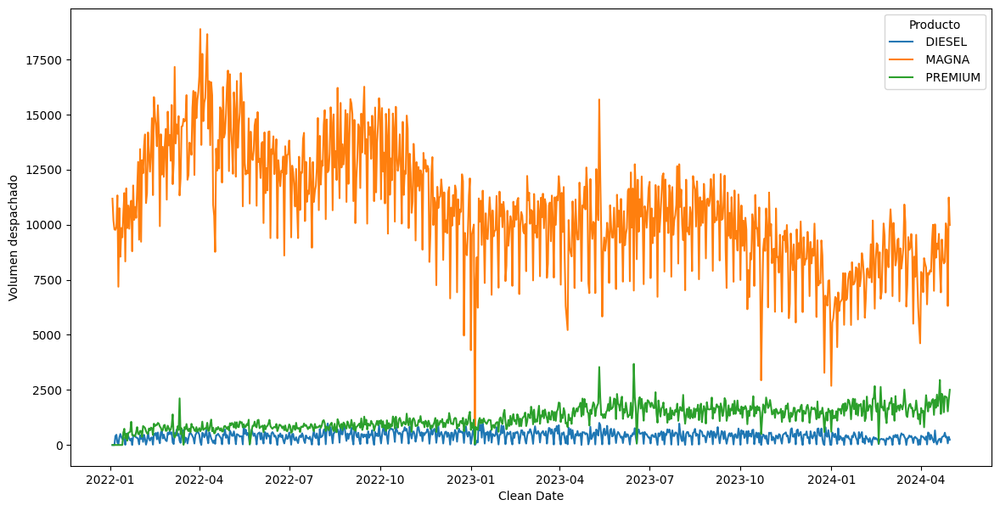

In [43]:
plt.figure(figsize = (14, 7))
sns.lineplot(data = grouped_date, x = 'Clean Date', y = 'Volumen despachado', hue = 'Producto')
plt.show()

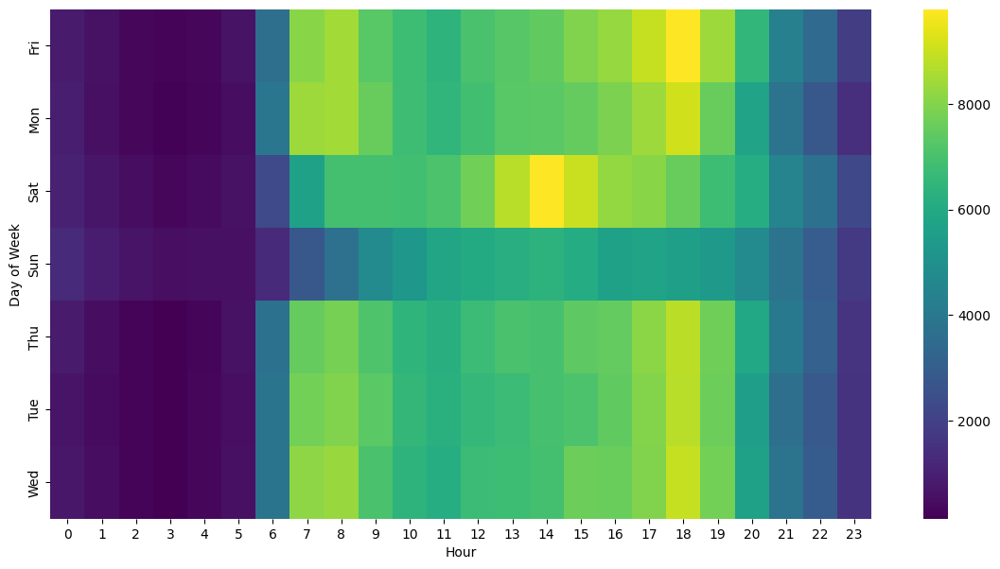

In [44]:
plt.figure(figsize = (14,7))
sns.heatmap(grouped_dayHour, cmap = 'viridis')
plt.show()

<Figure size 1400x700 with 0 Axes>

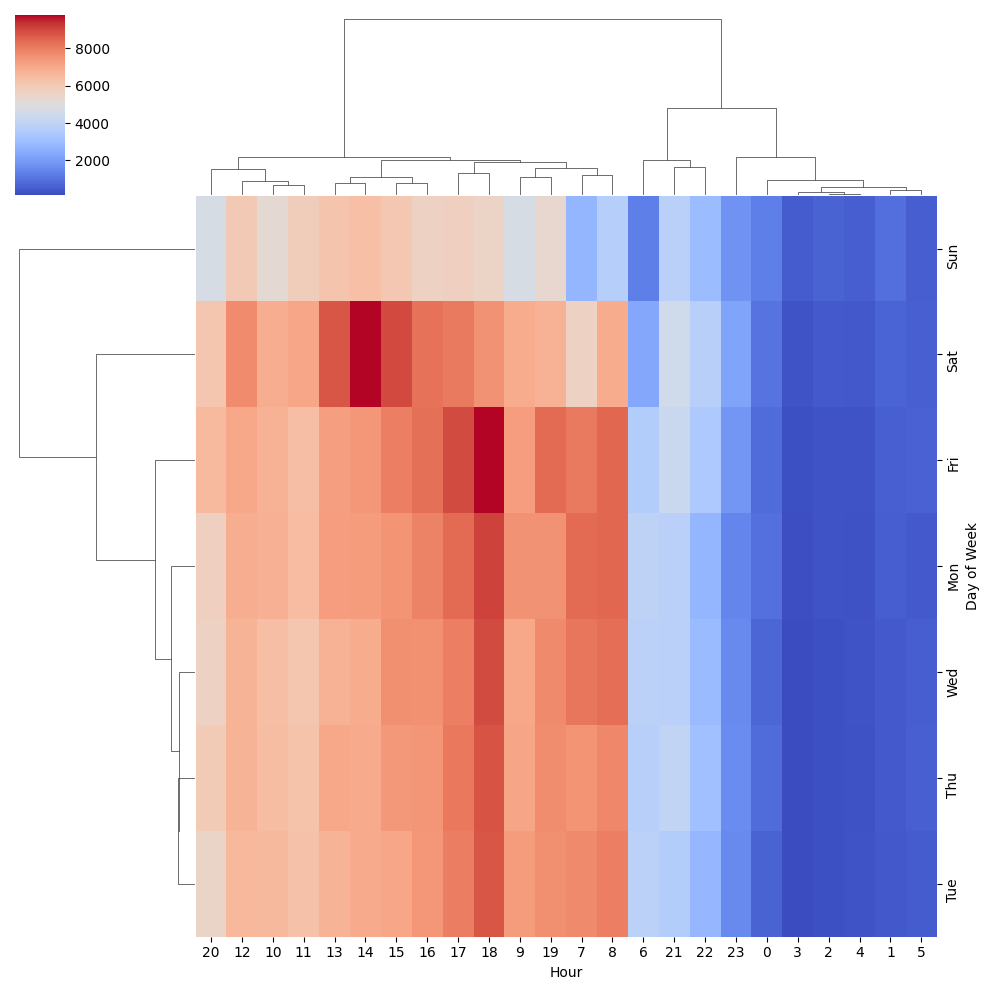

In [45]:
plt.figure(figsize = (14,7))
sns.clustermap(grouped_dayHour, cmap = 'coolwarm', method = 'centroid')
plt.show()

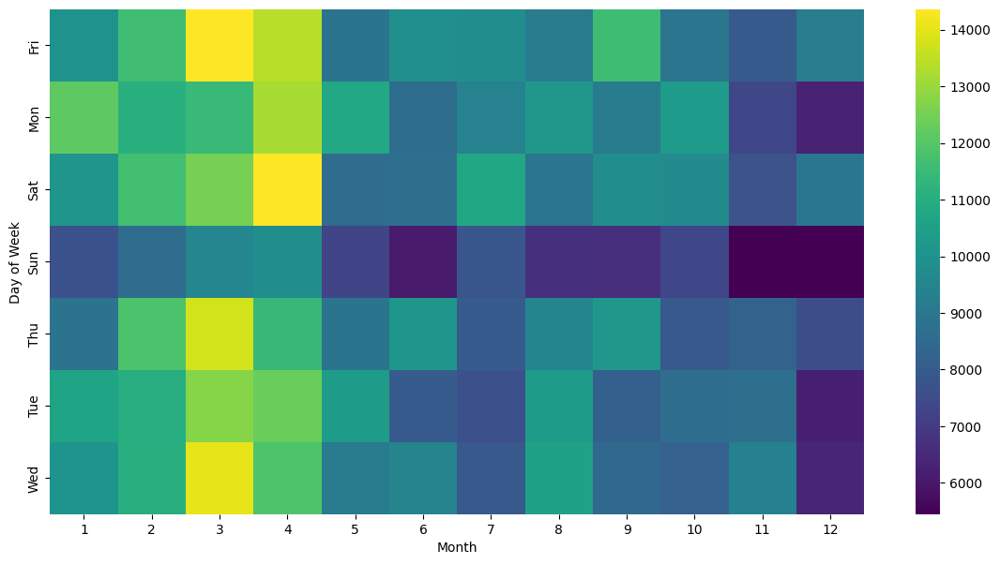

In [46]:
plt.figure(figsize = (14,7))
sns.heatmap(grouped_dayMonth,cmap = 'viridis')
plt.show()

<Figure size 1400x700 with 0 Axes>

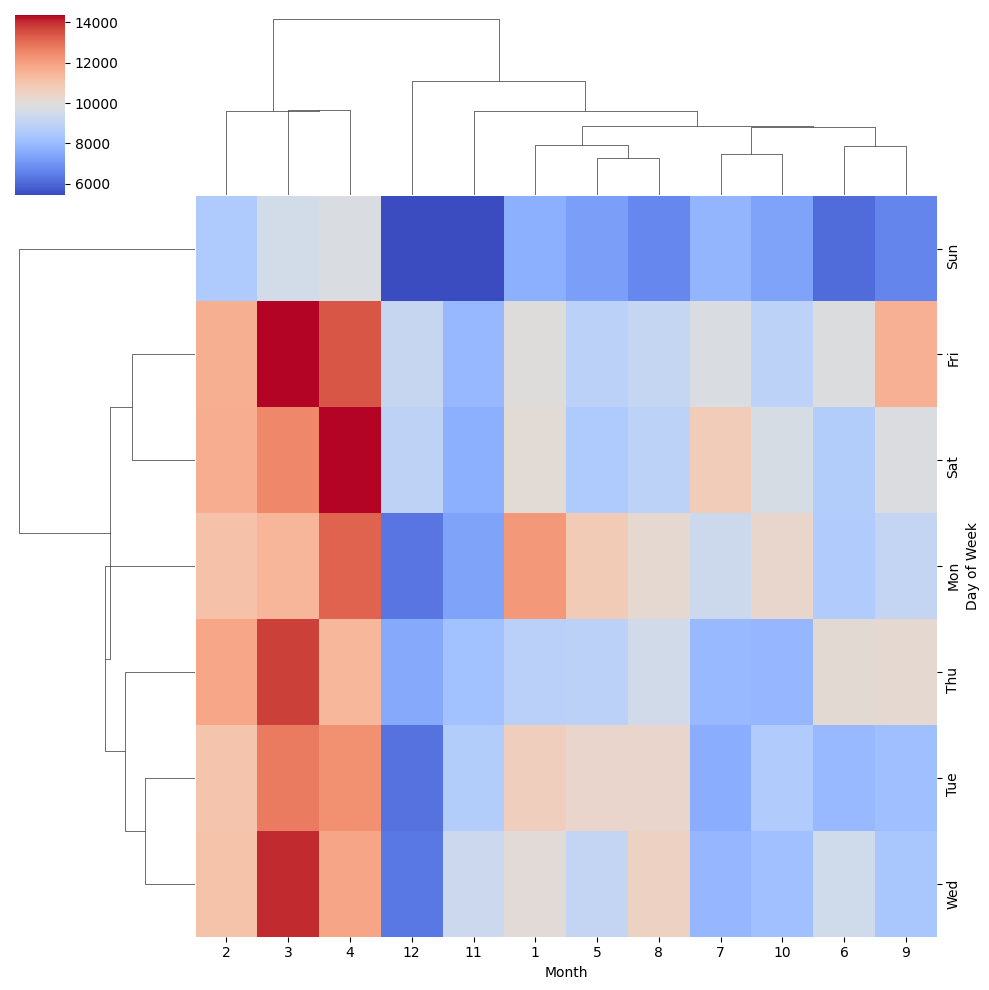

In [47]:
plt.figure(figsize = (14,7))
sns.clustermap(grouped_dayMonth,cmap = 'coolwarm', method = 'centroid')
plt.show()

In [48]:
df_magna.set_index('sale_timeStamp', inplace = True)
df_magna.sort_index(inplace = True)
df_premium.set_index('sale_timeStamp', inplace = True)
df_premium.sort_index(inplace = True)
df_diesel.set_index('sale_timeStamp', inplace = True)
df_diesel.sort_index(inplace = True)

#daily_magna_df = df_magna['Volumen despachado'].resample('D').sum()
#daily_premium_df = df_premium['Volumen despachado'].resample('D').sum() 
#daily_diesel_df = df_diesel['Volumen despachado'].resample('D').sum() 

***Análisis de Demanda Magna***

In [49]:
if not isinstance(df_magna.index, pd.DatetimeIndex):
    df_magna.index = pd.to_datetime(df_magna.index)

print("Start date:", df_magna.index[0])
print("End date:", df_magna.index[-1])
print("Number of data points:", len(df_magna))

if df_magna.index[0] <= pd.Timestamp.max - pd.DateOffset(days = len(df_magna)):
    if not df_magna.index.freq:
        df_magna.index.freq = 'h'

Start date: 2022-01-03 00:00:00
End date: 2024-04-30 23:00:00
Number of data points: 20376


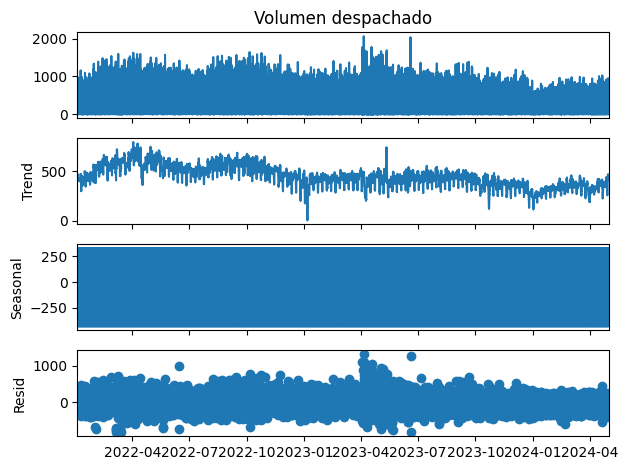

In [50]:
decomposition_magna = sm.tsa.seasonal_decompose(df_magna['Volumen despachado'], model = 'additive')

trend_magna = decomposition_magna.trend
seasonal_magna = decomposition_magna.seasonal
residual_magna = decomposition_magna.resid

fig = decomposition_magna.plot()
plt.show()

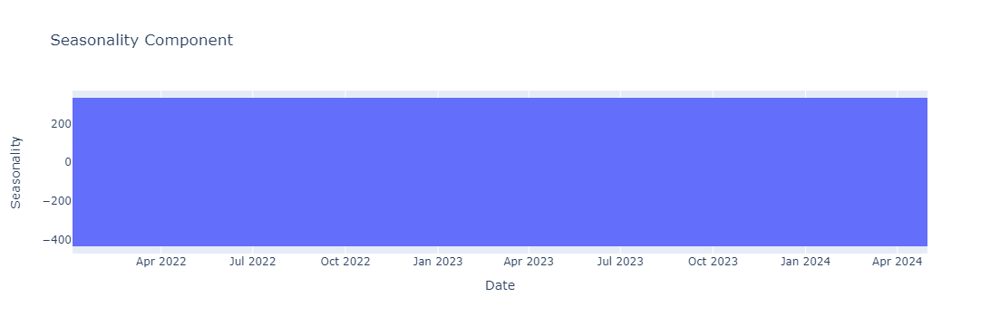

In [51]:
fig = px.line(x = df_magna['Volumen despachado'].index, y = seasonal_magna, labels={'y': 'Seasonality', 'x': 'Date'}, title = 'Seasonality Component')
fig.show()

In [52]:
print("Statistical Summary of Trend Component:")
print(trend_magna.describe())

print("\nStatistical Summary of Seasonal Component:")
print(seasonal_magna.describe())

print("\nStatistical Summary of Residual Component:")
print(residual_magna.describe())

Statistical Summary of Trend Component:
count    20352.000000
mean       445.416096
std        106.556749
min          2.196792
25%        373.278781
50%        438.623552
75%        517.019766
max        791.865625
Name: trend, dtype: float64

Statistical Summary of Seasonal Component:
count    2.037600e+04
mean    -1.291084e-14
std      2.891621e+02
min     -4.293881e+02
25%     -3.376257e+02
50%      1.723236e+02
75%      2.505608e+02
max      3.285681e+02
Name: seasonal, dtype: float64

Statistical Summary of Residual Component:
count    20352.000000
mean        -0.013118
std        147.754422
min       -828.495710
25%        -89.877715
50%         -3.430859
75%         82.162978
max       1310.631200
Name: resid, dtype: float64


In [53]:
original = df_magna['Volumen despachado']
print("Correlation with Original Series:")
print("Trend Correlation:", original.corr(trend_magna))
print("Seasonal Correlation:", original.corr(seasonal_magna))
print("Residual Correlation:", original.corr(residual_magna))

Correlation with Original Series:
Trend Correlation: 0.3308410197977389
Seasonal Correlation: 0.8406838654490294
Residual Correlation: 0.4446589798518961


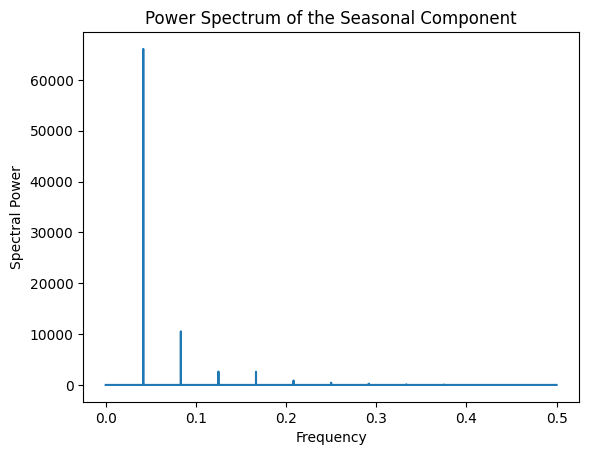

In [54]:
frequencies_magna, spectrum_magna = periodogram(seasonal_magna.dropna(), scaling = 'spectrum')
plt.figure()
plt.plot(frequencies_magna, spectrum_magna)
plt.title('Power Spectrum of the Seasonal Component')
plt.xlabel('Frequency')
plt.ylabel('Spectral Power')
plt.show()

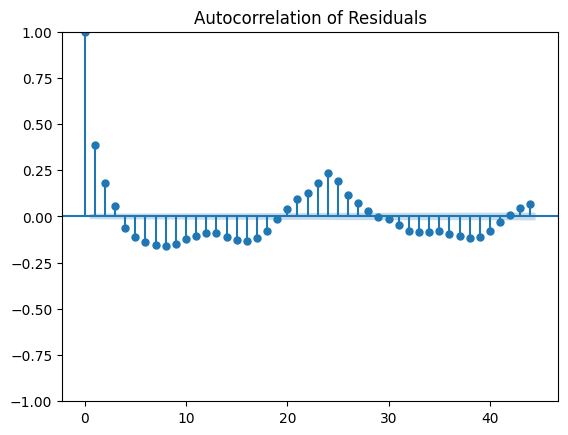

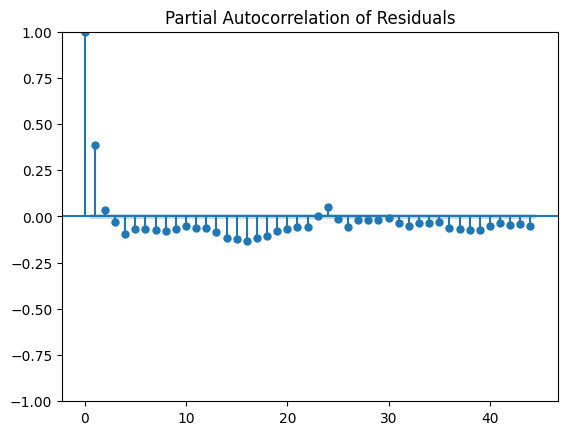

In [55]:
plot_acf(residual_magna.dropna())
plt.title('Autocorrelation of Residuals')
plt.show()

plot_pacf(residual_magna.dropna())
plt.title('Partial Autocorrelation of Residuals')
plt.show()

***Análisis de Demanda Premium***

In [56]:
if not isinstance(df_premium.index, pd.DatetimeIndex):
    df_premium.index = pd.to_datetime(df_premium.index)

print("Start date:", df_premium.index[0])
print("End date:", df_premium.index[-1])
print("Number of data points:", len(df_premium))

if df_premium.index[0] <= pd.Timestamp.max - pd.DateOffset(days = len(df_premium)):
    if not df_premium.index.freq:
        df_premium.index.freq = 'h'

Start date: 2022-01-03 00:00:00
End date: 2024-04-30 23:00:00
Number of data points: 20376


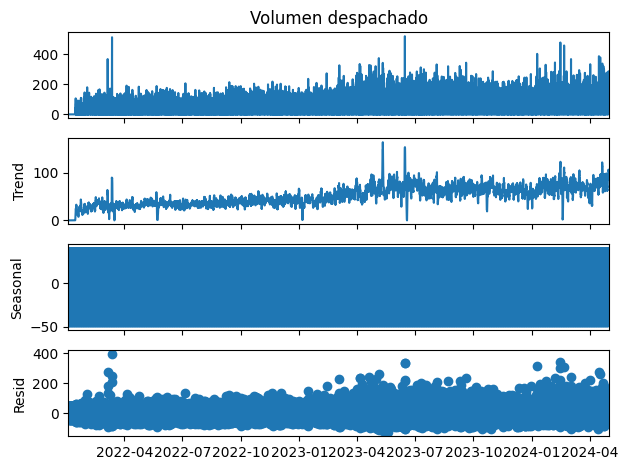

In [57]:
decomposition_premium = sm.tsa.seasonal_decompose(df_premium['Volumen despachado'], model = 'additive')

trend_premium = decomposition_premium.trend
seasonal_premium = decomposition_premium.seasonal
residual_premium = decomposition_premium.resid

fig = decomposition_premium.plot()
plt.show()

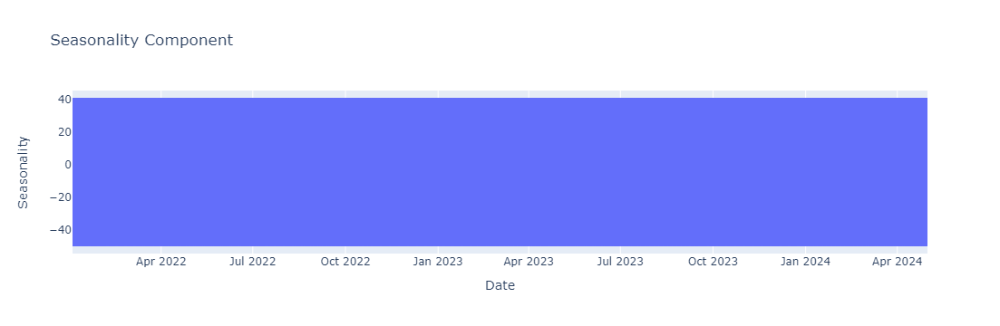

In [58]:
fig = px.line(x = df_premium['Volumen despachado'].index, y = seasonal_premium, labels={'y': 'Seasonality', 'x': 'Date'}, title = 'Seasonality Component')
fig.show()

In [59]:
print("Statistical Summary of Trend Component:")
print(trend_premium.describe())

print("\nStatistical Summary of Seasonal Component:")
print(seasonal_premium.describe())

print("\nStatistical Summary of Residual Component:")
print(residual_premium.describe())

Statistical Summary of Trend Component:
count    20352.000000
mean        51.051016
std         20.403300
min          0.000000
25%         35.702766
50%         48.564573
75%         66.234286
max        164.223083
Name: trend, dtype: float64

Statistical Summary of Seasonal Component:
count    2.037600e+04
mean    -2.859467e-16
std      3.351327e+01
min     -4.974718e+01
25%     -3.666439e+01
50%      1.564700e+01
75%      2.988250e+01
max      4.020807e+01
Name: seasonal, dtype: float64

Statistical Summary of Residual Component:
count    20352.000000
mean        -0.005143
std         37.878559
min       -124.950989
25%        -24.516610
50%         -2.744473
75%         17.821488
max        392.213510
Name: resid, dtype: float64


In [60]:
original = df_premium['Volumen despachado']
print("Correlation with Original Series:")
print("Trend Correlation:", original.corr(trend_premium))
print("Seasonal Correlation:", original.corr(seasonal_premium))
print("Residual Correlation:", original.corr(residual_premium))

Correlation with Original Series:
Trend Correlation: 0.383494716142899
Seasonal Correlation: 0.6117207727260315
Residual Correlation: 0.6978413507019231


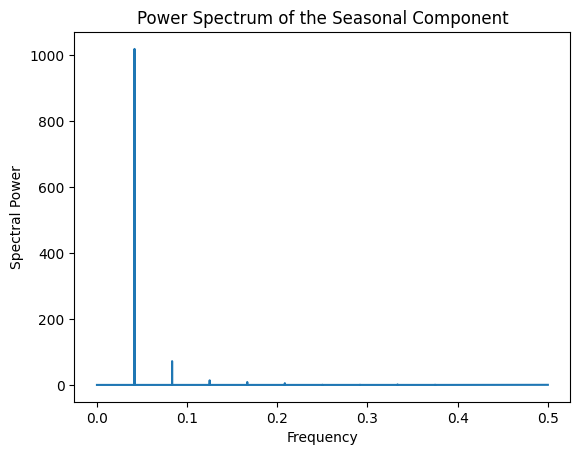

In [61]:
frequencies_premium, spectrum_premium = periodogram(seasonal_premium.dropna(), scaling = 'spectrum')
plt.figure()
plt.plot(frequencies_premium, spectrum_premium)
plt.title('Power Spectrum of the Seasonal Component')
plt.xlabel('Frequency')
plt.ylabel('Spectral Power')
plt.show()

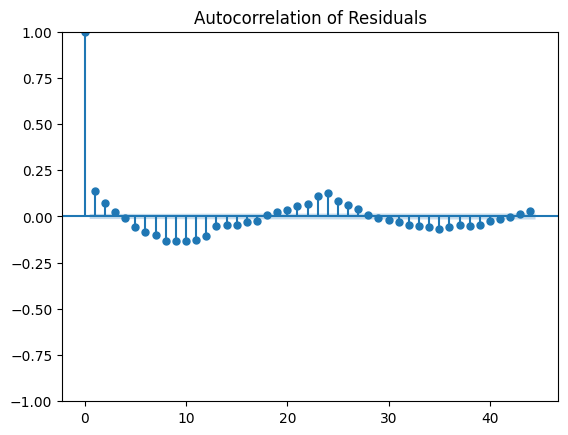

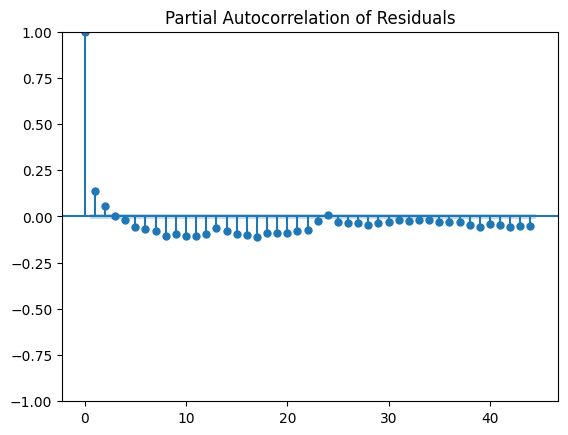

In [62]:
plot_acf(residual_premium.dropna())
plt.title('Autocorrelation of Residuals')
plt.show()

plot_pacf(residual_premium.dropna())
plt.title('Partial Autocorrelation of Residuals')
plt.show()

***Análisis de Demanda Diesel***

In [63]:
if not isinstance(df_diesel.index, pd.DatetimeIndex):
    df_diesel.index = pd.to_datetime(df_diesel.index)

print("Start date:", df_diesel.index[0])
print("End date:", df_diesel.index[-1])
print("Number of data points:", len(df_diesel))

if df_diesel.index[0] <= pd.Timestamp.max - pd.DateOffset(days = len(df_diesel)):
    if not df_diesel.index.freq:
        df_diesel.index.freq = 'h'

Start date: 2022-01-03 00:00:00
End date: 2024-04-30 23:00:00
Number of data points: 20376


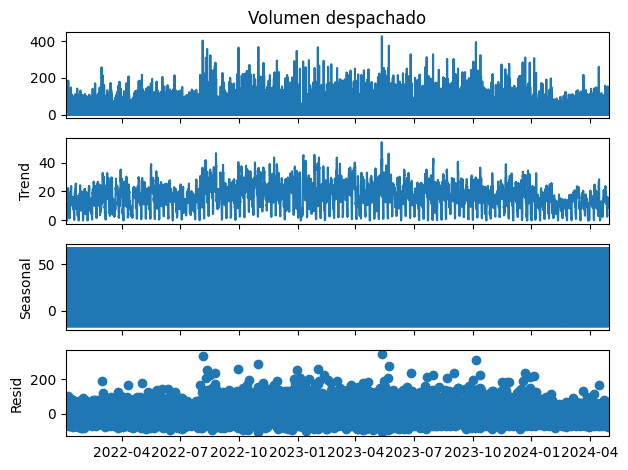

In [64]:
decomposition_diesel = sm.tsa.seasonal_decompose(df_diesel['Volumen despachado'], model = 'additive')

trend_diesel = decomposition_diesel.trend
seasonal_diesel = decomposition_diesel.seasonal
residual_diesel = decomposition_diesel.resid

fig = decomposition_diesel.plot()
plt.show()

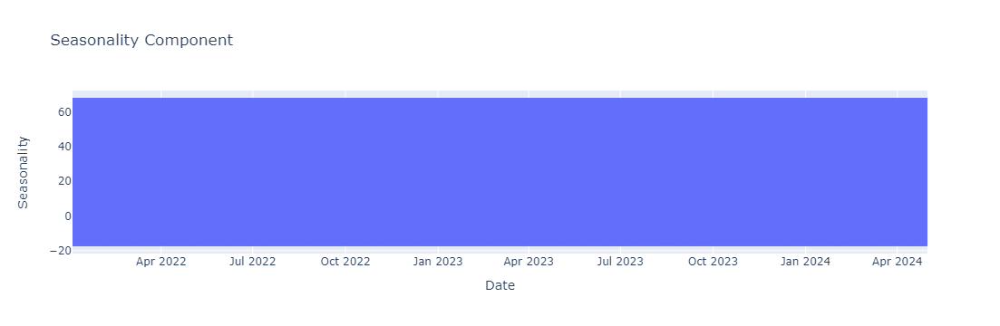

In [65]:
fig = px.line(x = df_diesel['Volumen despachado'].index, y = seasonal_diesel, labels={'y': 'Seasonality', 'x': 'Date'}, title = 'Seasonality Component')
fig.show()

In [66]:
print("Statistical Summary of Trend Component:")
print(trend_diesel.describe())

print("\nStatistical Summary of Seasonal Component:")
print(seasonal_diesel.describe())

print("\nStatistical Summary of Residual Component:")
print(residual_diesel.describe())

Statistical Summary of Trend Component:
count    20352.000000
mean        17.102592
std          8.684034
min          0.000000
25%         11.419583
50%         17.397510
75%         22.887021
max         54.031208
Name: trend, dtype: float64

Statistical Summary of Seasonal Component:
count    2.037600e+04
mean     3.835871e-16
std      2.010416e+01
min     -1.695829e+01
25%     -1.633007e+01
50%     -4.519686e+00
75%      7.162788e+00
max      6.753095e+01
Name: seasonal, dtype: float64

Statistical Summary of Residual Component:
count    20352.000000
mean         0.001429
std         28.581841
min       -107.439867
25%        -13.315737
50%         -2.487500
75%          7.489637
max        345.989084
Name: resid, dtype: float64


In [67]:
original = df_diesel['Volumen despachado']
print("Correlation with Original Series:")
print("Trend Correlation:", original.corr(trend_diesel))
print("Seasonal Correlation:", original.corr(seasonal_diesel))
print("Residual Correlation:", original.corr(residual_diesel))

Correlation with Original Series:
Trend Correlation: 0.26052401614447307
Seasonal Correlation: 0.5552005514722134
Residual Correlation: 0.7960786058644161


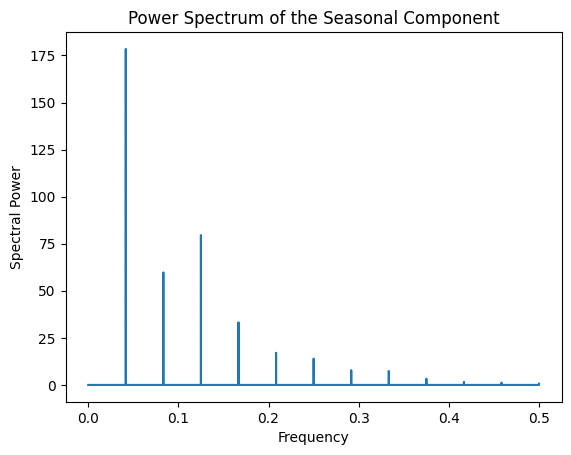

In [68]:
frequencies_diesel, spectrum_diesel = periodogram(seasonal_diesel.dropna(), scaling = 'spectrum')
plt.figure()
plt.plot(frequencies_diesel, spectrum_diesel)
plt.title('Power Spectrum of the Seasonal Component')
plt.xlabel('Frequency')
plt.ylabel('Spectral Power')
plt.show()

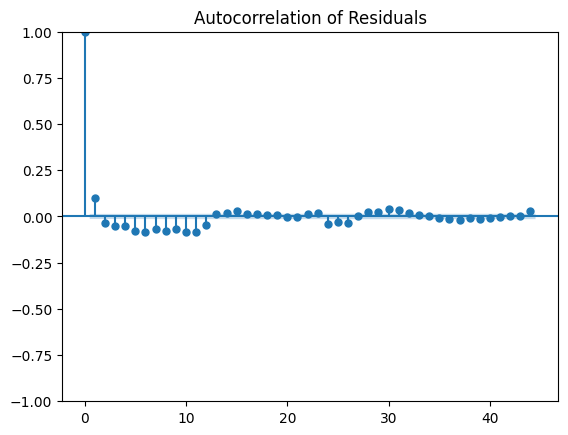

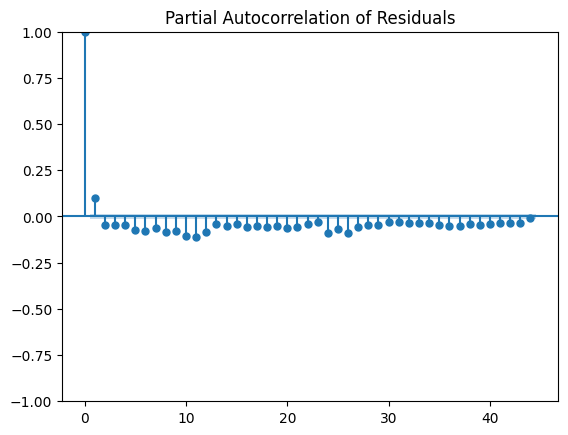

In [69]:
plot_acf(residual_diesel.dropna())
plt.title('Autocorrelation of Residuals')
plt.show()

plot_pacf(residual_diesel.dropna())
plt.title('Partial Autocorrelation of Residuals')
plt.show()

In [70]:
df_magna.to_pickle(f'base_magna.pkl')
df_premium.to_pickle(f'base_magna.pkl')
df_diesel.to_pickle(f'base_diesel.pkl')

**Conclusiones**

Para este análisis de la base de datos de nuestro Proyecto de Modelo para Optimización de Precios en Estaciones de Autoservicio tomamos como referencia la base diaria de ventas para el periodo 2022-2024 (abril). En primer lugar, consolidamos las bases de datos asegurándonos que cumplan con el tipo de dato correspondiente a la naturaleza de cada variable para poder analizar el contenido de la base de datos. 
Encontramos una gran cantidad de datos faltantes en variables relacionadas a información de los clientes de las gasolineras, como placa o tipo de vehículo, por lo cual no se podría realizar una segmentación de clientes de manera óptima, debido a que en algunos casos la data faltante representa alrededor del 70% de la base total. 

Las variables completas hacen referencia a información de la transacción de Ventas de 1 gasolinera, en la cual encontramos 3 variables numéricas, 2 variables categóricas, 2 variables que hacen referencia a la fecha de la transacción y 1 variable de identificación de la transacción. 
Encontramos valores atípicos que pueden deberse a una incorrecta digitación de la información (por ejemplo, una venta fue de 6 millones de galones) por lo cual decidimos filtrar el 10% de los valores más altos de la variable Cantidad para poder realizar el análisis exploratorio. 
En cuanto a información temporal, realizamos varios análisis gráficos de las series de tiempo y el principal hallazgo fue que la cantidad de combustible MAGNA (categoría de producto más vendido por la gasolinera) presenta una tendencia decreciente en el periodo analizado, mientras que la venta del combustible PREMIUM muestra una ligera tendencia creciente en el mismo periodo. 

Como nota adicional, una de las variables más importantes, el costo del combustible no fue entregada por parte de la empresa. Como equipo realizamos gestiones y recibimos parte de la base de datos y un compromiso de la empresa de entregar hasta el miércoles 8 de Mayo la base de datos completa de costos de combustible.